In [1]:
import os # to get the path of the files
from glob import glob
import shutil

import sys # to get the arguments
import numpy as np # to work with arrays
import pandas as pd # to work with dataframes
import gc # to clean the memory

import itertools # to work with iterators
from tqdm import tqdm # to show the progress bar
import matplotlib.pyplot as plt # to show the images
from glob import glob # to get the path of the files
import PIL.Image as Image # to work with images
import numpy as np # to work with arrays
import matplotlib.pyplot as plt # to show the images

import torch # to build the model
from torch import nn # to build the model
import torch.nn.functional as F # to build the model
# import torchvision.transforms as transforms # to build the model
from torchvision import transforms,datasets,utils
import timm # to build the model

from torch.utils.data import Dataset, DataLoader # to build the model
from torch.utils.data.sampler import SequentialSampler, RandomSampler # to build the model
from torch.optim.lr_scheduler import CosineAnnealingLR, CosineAnnealingWarmRestarts, ReduceLROnPlateau # to build the model

#defining the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

# remove warnings
import warnings
warnings.filterwarnings('ignore')


cpu


In [2]:
# we will make folder with some images that are similar to the images in the dataset and some images that are not

folders =['/kaggle/input/chest-xray-images-pneumonia-with-new-class/Data_blance/Test/Normal',
          '/kaggle/input/chest-xray-images-pneumonia-with-new-class/Data_blance/Test/bacteria',
          '/kaggle/input/chest-xray-images-pneumonia-with-new-class/Data_blance/Test/virus',
          '/kaggle/input/intel-image-classification/seg_train/seg_train/forest',
          '/kaggle/input/intel-image-classification/seg_train/seg_train/buildings',
          '/kaggle/input/intel-image-classification/seg_train/seg_train/sea']

def make_test_images(folders):
    '''
  Folders is a collection of directories housing various images. 
  The initial three folders consist of images that closely resemble those in the dataset,
  while the remaining folders contain images that differ significantly.
  Our objective is to select ten images from each folder. 
  To achieve this, we will create two separate directories—one for the similar images and another for the dissimilar images
    '''
    # make the folders
    os.mkdir('test_images')
    os.mkdir('test_images/sim')
    os.mkdir('test_images/diff')

    for idx in tqdm(range(len(folders))):
        if idx < 3:
            imges = glob(folders[idx]+'/*.jpeg')
            print('sim ',len(imges))
            images_10 = np.random.choice(imges,10)
            for image in images_10:
                shutil.copy(image,'test_images/sim')
        else:
            imges = glob(folders[idx]+'/*.jpg')
            print('diff ',len(imges))
            images_10 = np.random.choice(imges,10)
            for image in images_10:
                shutil.copy(image,'test_images/diff')

make_test_images(folders)

 17%|█▋        | 1/6 [00:00<00:00,  8.02it/s]

sim  100
sim  100
sim  100


 50%|█████     | 3/6 [00:00<00:00, 13.65it/s]

diff  2271
diff  2191


 83%|████████▎ | 5/6 [00:00<00:00,  8.19it/s]

diff  2274


100%|██████████| 6/6 [00:00<00:00,  8.11it/s]


In [3]:
num_workers = torch.get_num_threads()*2
print("Number of workers:", num_workers)

batch_size = 128
print("Batch size:", batch_size)
img_size = 224

transforms_valid = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

Number of workers: 4
Batch size: 128


In [4]:
test_ds = datasets.ImageFolder(root = '/kaggle/input/chest-xray-images-pneumonia-with-new-class/Data_blance/Test',
                                    transform = transforms_valid)
test_dl = DataLoader(test_ds, batch_size=batch_size, shuffle=False, num_workers=num_workers)


In [5]:
diff_ds = datasets.ImageFolder(root = '/kaggle/input/intel-image-classification/seg_train/seg_train/',
                                    transform = transforms_valid)
diff_dl = DataLoader(diff_ds, batch_size=batch_size, shuffle=False, num_workers=num_workers)


In [6]:
val_ds = datasets.ImageFolder(root = '/kaggle/working/test_images',
                                    transform = transforms_valid)
val_dl = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=num_workers)


In [7]:
def plot_one_batch(dl):
    for images, labels in dl:
        images_denorm = images*0.225 + 0.45
        fig, ax = plt.subplots(figsize=(20, 20))
        ax.set_xticks([])
        ax.set_yticks([])
        ax.imshow(utils.make_grid(images_denorm[20:45], nrow=5).permute(1, 2, 0))
        break

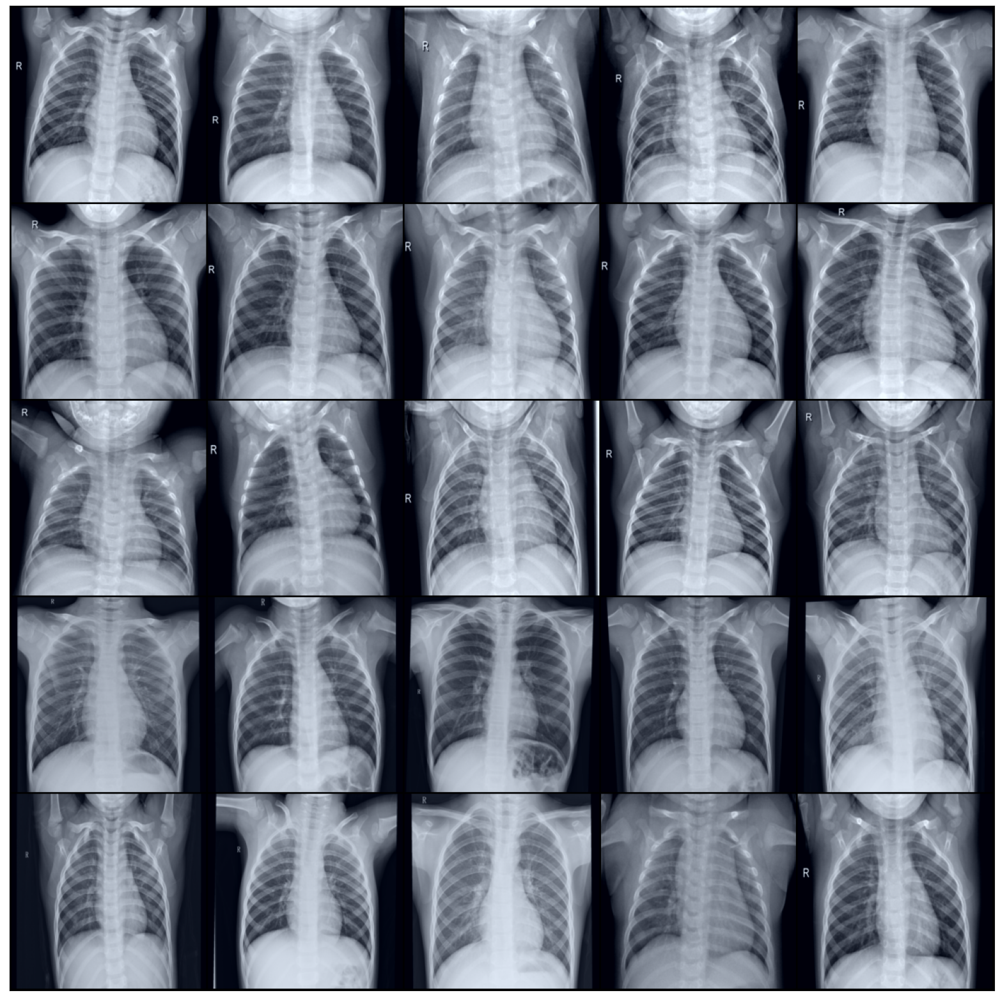

In [8]:
plot_one_batch(test_dl)


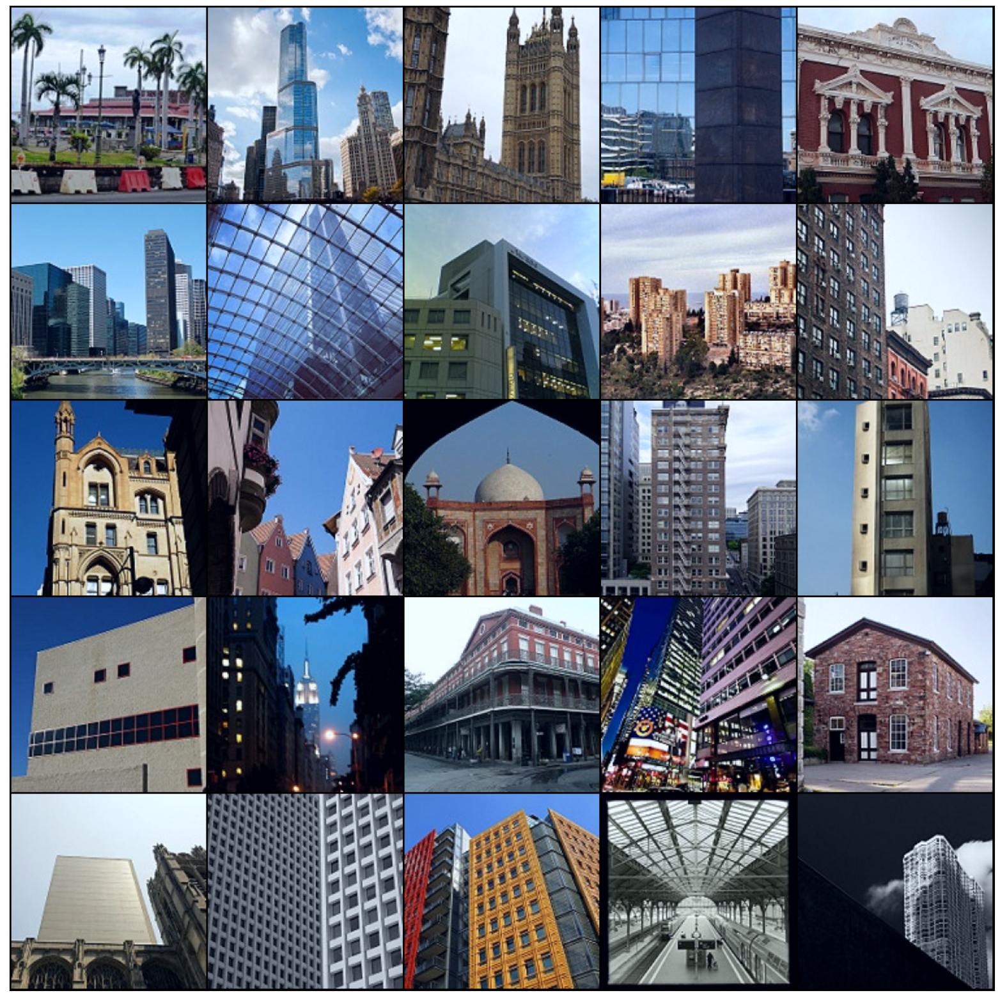

In [9]:
plot_one_batch(diff_dl)


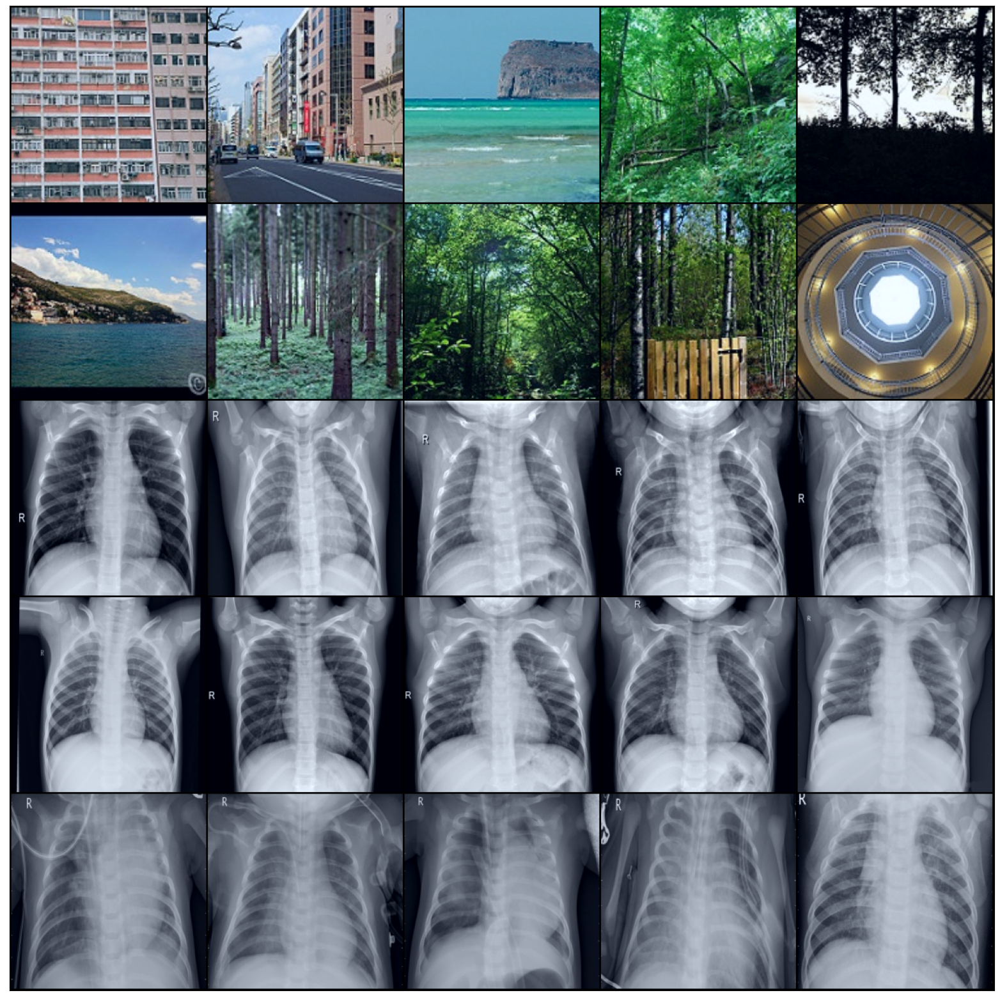

In [10]:
plot_one_batch(val_dl)


In [11]:
# get classes dictionary
classes = test_ds.class_to_idx
classes

{'Normal': 0, 'bacteria': 1, 'virus': 2}

In [12]:
class GraphClassifier2(nn.Module):
    def __init__(self, model_name='vit_base_patch16_224', pretrained=False):
        super().__init__()
        self.model = timm.create_model(model_name, pretrained=pretrained)
        n_features = self.model.head.in_features
        self.model.head = nn.Linear(n_features, len(classes))
        # stop the model from training
        for param in self.model.parameters():
            param.requires_grad = False
        # train the last  5 layer
        for param in self.model.blocks[-5:].parameters():
            param.requires_grad = True
        for param in self.model.head.parameters():
            param.requires_grad = True
    def forward(self, x):
        x = self.model(x)
        # add softmax
        x = F.softmax(x, dim=1)
        
        return x

In [13]:
model = GraphClassifier2(model_name='vit_base_patch16_224', pretrained=True).to(device)


In [14]:
model.load_state_dict(torch.load('/kaggle/input/image-classification-training/best_models/model2.pt',map_location=torch.device('cpu')))

<All keys matched successfully>

In [15]:
# read image from path and make prediction
import cv2
img = cv2.imread('/kaggle/input/chest-xray-images-pneumonia-with-new-class/Data_blance/Test/bacteria/person100_bacteria_479.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (img_size, img_size))
img = img/255.0
img = np.transpose(img, (2, 0, 1))
img = torch.tensor(img, dtype=torch.float)
img = img.unsqueeze(0)
img.shape


torch.Size([1, 3, 224, 224])

In [16]:
log_ps = model(img)
log_ps

tensor([[2.1536e-04, 6.1931e-01, 3.8048e-01]], grad_fn=<SoftmaxBackward0>)

Text(0.5, 1.0, 'Real : 1 Predicted: 1, Probability : 0.619')

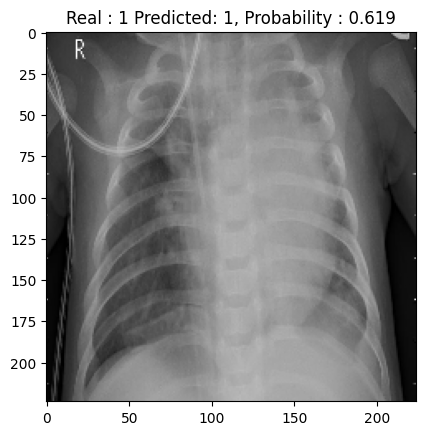

In [17]:
plt.imshow(np.transpose(img[0], (1, 2, 0)))
plt.title(f"Real : 1 Predicted: {log_ps.argmax()}, Probability : {log_ps[0].max():.3f}")

In [18]:
# make a classification report
from sklearn.metrics import classification_report
y_true = []
y_pred = []
for images, labels in tqdm(test_dl):
    images = images.to(device)
    labels = labels.to(device)
    log_ps = model(images)
    y_true.extend(labels.cpu().numpy())
    y_pred.extend(log_ps.argmax(dim=1).cpu().numpy())
print()
print(classification_report(y_true, y_pred, target_names=classes.keys()))

100%|██████████| 3/3 [02:21<00:00, 47.22s/it]


              precision    recall  f1-score   support

      Normal       0.91      0.97      0.94       100
    bacteria       0.82      0.75      0.78       100
       virus       0.77      0.78      0.78       100

    accuracy                           0.83       300
   macro avg       0.83      0.83      0.83       300
weighted avg       0.83      0.83      0.83       300



In [19]:
model.model.blocks[-1].norm2

LayerNorm((768,), eps=1e-06, elementwise_affine=True)

In [20]:
# make a feature extractor model based on the trained model just remove the last layer
feature_extractor = nn.Sequential(*list(model.model.children())[:-1]).eval()


In [21]:
def threshold_similarity(test_dl=test_dl):
    for images, labels in tqdm(test_dl):
        images = images.to(device)
        labels = labels.to(device)
    
    # get 10 random images from all classes
    features = []
    for i in range(10):
        image = images[i + np.random.randint(0, 10)].unsqueeze(0)
        features.append(feature_extractor(image).cpu().detach().numpy())
    # get similarity between each pair of images
    
#     features_tensor = torch.from_numpy(features)

    similarity = []
    for i in range(10):
        for j in range(10):
            similarity.append(torch.nn.functional.cosine_similarity(torch.from_numpy(features[i]).unsqueeze(0), torch.from_numpy(features[j]).unsqueeze(0)))
    # get the mean of all similarity
    similarity
    means = []
    for i in similarity:
        means.append(float(i.mean()))
    return sum(means)/len(means)


threshold = threshold_similarity(test_dl=test_dl)
threshold

100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


0.8146364784240723

In [22]:
threshold = 0.65 # max vlaue was 80 min walue was 68 

In [23]:
def check_img(img,test_dl,threshold=threshold ,t=1):
    '''
    img from data loader
    '''
    # get 10 random images from all classes
    for images, labels in test_dl:
        images = images.to(device)
        labels = labels.to(device)

    features = []
    for i in range(10):
        image = images[i + np.random.randint(0, 10)].unsqueeze(0)
        features.append(feature_extractor(image).cpu().detach().numpy())

    # get similarity between image and each img in features
    similarity = []
    for i in range(10):
        if t == 1:
            similarity.append(torch.nn.functional.cosine_similarity(torch.from_numpy(features[i]).unsqueeze(0), feature_extractor(img)))
        else :
            similarity.append(torch.nn.functional.cosine_similarity(torch.from_numpy(features[i]).unsqueeze(0), feature_extractor(img.unsqueeze(0))))

    # get the mean of all similarity
    means = []
    for i in similarity:
        means.append(float(i.mean()))
    mean = sum(means)/len(means)
    #check if the mean is greater than the threshold or not
#     if mean > threshold:
#         print("The input image is similar to the images in the test_dl")
#     else:
#         print("The input image is not similar to the images in the test_dl")

#     print("The mean of similarity is:", mean)
    return mean



In [24]:
the = check_img(img,test_dl,threshold=threshold)
if the > threshold:
    print("The input image is similar to the images in the test_dl")
else:
    print("The input image is not similar to the images in the test_dl")
print(the)

The input image is similar to the images in the test_dl
0.6756563544273376


In [25]:
from sklearn.metrics import confusion_matrix

def check_val_dl(val_dl,threshold=threshold):
    y_true = []
    y_pred = []

    for images, labels in tqdm(val_dl):
        images = images.to(device)
        labels = labels.to(device)
        for image in images:
            mean = check_img(image,test_dl,threshold=threshold,t=2)
            if mean > threshold:
                y_pred.append(1)
            else:
                y_pred.append(0)
        for label in labels:
            y_true.append(label.cpu().numpy())
    print(confusion_matrix(y_true, y_pred))
    return y_true,y_pred




In [26]:
y_true,y_pred = check_val_dl(val_dl,threshold=threshold)

100%|██████████| 1/1 [13:12<00:00, 792.15s/it]

[[25  5]
 [ 0 27]]


In [27]:
print(classification_report(y_true, y_pred,))


              precision    recall  f1-score   support

           0       1.00      0.83      0.91        30
           1       0.84      1.00      0.92        27

    accuracy                           0.91        57
   macro avg       0.92      0.92      0.91        57
weighted avg       0.93      0.91      0.91        57



In [28]:
# we will make a function to check if the input image is similar to the images in test_dl or not
def check_similarity(image_pth, threshold=threshold, test_dl=test_dl):
    # read image from path and make prediction
    img = cv2.imread(image_pth)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (img_size, img_size))
    img = img/255.0
    img = np.transpose(img, (2, 0, 1))
    img = torch.tensor(img, dtype=torch.float)
    img = img.unsqueeze(0)
    img.shape

    log_ps = model(img.to(device))
    log_ps

    plt.imshow(np.transpose(img[0], (1, 2, 0)))
    plt.title(f"Real : 1 Predicted: {log_ps.argmax()}, Probability : {log_ps[0].max():.3f}")
    
    # get the feature of the input image
    feature = feature_extractor(img).cpu().detach().numpy()
    
    # get the similarity between the input image and the images in test_dl
    similarity = []
    for images, labels in tqdm(test_dl):
        images = images.to(device)
        labels = labels.to(device)
        for image in images:
            similarity.append(torch.nn.functional.cosine_similarity(torch.from_numpy(feature).unsqueeze(0), feature_extractor(image.unsqueeze(0))))
    
    # get the mean of all similarity
    means = []
    for i in similarity:
        means.append(float(i.mean()))
    mean = sum(means)/len(means)
    
    # check if the mean is greater than the threshold or not
    if mean > threshold:
        print("The input image is similar to the images in the test_dl")
    else:
        print("The input image is not similar to the images in the test_dl")
    print("The mean of similarity is:", mean)
    
    return mean

100%|██████████| 3/3 [02:28<00:00, 49.45s/it]


The input image is not similar to the images in the test_dl
The mean of similarity is: 0.2686983600258827


0.2686983600258827

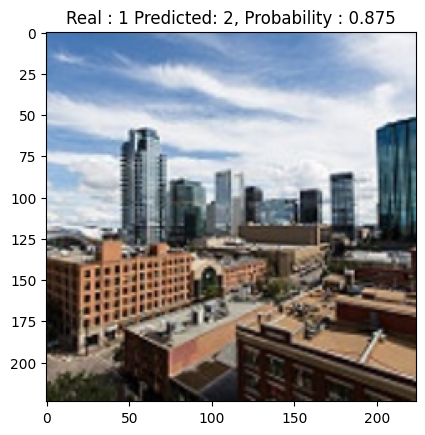

In [29]:
check_similarity('/kaggle/input/intel-image-classification/seg_train/seg_train/buildings/10006.jpg')